# Interacting with CLIP (Zero-shot segmentation)

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [1]:
# ! pip install ftfy regex tqdm
# ! pip install git+https://github.com/ricardodeazambuja/CLIP.git@attn_weights

In [2]:
import numpy as np
import torch
from pkg_resources import packaging

print("Torch version:", torch.__version__)


Torch version: 1.13.1


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [3]:
import clip

clip.available_models()

['ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']

In [4]:
model, preprocess = clip.load("ViT-B/32")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

Model stats for ViT-B/32
- output_embed_dim: 512
- vision_width: 768
- vision_layers: 12
- vision_patch_size: 32
- vision_heads: 12
- grid_size: 7
- image_resolution: 224
- context_length: 77
- vocab_size: 49408
- transformer_width: 512
- transformer_heads: 8
- transformer_layers: 12
- total number of parameters: 151,277,313


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [5]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=None)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7f4b02bbc9d0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

In [6]:
from PIL import Image
from PIL.Image import FLIP_LEFT_RIGHT, FLIP_TOP_BOTTOM
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.nn.functional import interpolate

from torchvision.transforms.functional import to_tensor, normalize, gaussian_blur

Original size (912, 913)
Final size (800, 800)


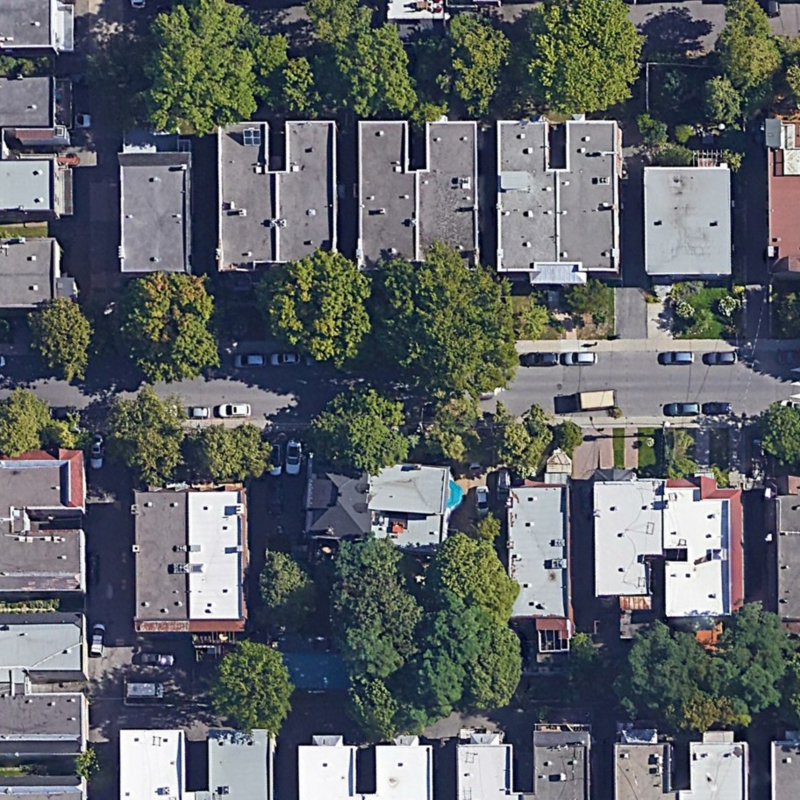

In [7]:
# input_image = Image.open('test_google_earth.png')
# input_image = Image.open('../example_earth_100m.jpg')
input_image = Image.open('../example_earth_200m.jpg')
# input_image = Image.open('../example_earth_high_altitude.jpg')


#
# The input image needs to be square
# 
print(f"Original size {input_image.size}")
input_image = input_image.resize((800,800))
print(f"Final size {input_image.size}")
input_image

In [8]:
prompt = "a photo of a neighbourhood"
text_tokens = clip.tokenize([prompt]).cuda()
image_input = preprocess(input_image.copy()).unsqueeze(0).cuda()

with torch.no_grad():
    image_features, image_attn_weights = model.encode_image(image_input)
    image_features = image_features.float()
    text_features, text_attn_weights = model.encode_text(text_tokens)
    text_features = text_features.float()
        
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)
    similarity = text_features @ image_features.T

print(similarity)

tensor([[0.3048]], device='cuda:0')


## Simplest way: adapting from this post
https://www.pinecone.io/learn/zero-shot-object-detection-clip/

In [9]:
def mirror_padding(input_image, grid_size, window):

    patch_dim = int(input_image.size[0]/grid_size)
    assert (input_image.size[0] % grid_size) == 0, f"grid_size {grid_size} must match image size {input_image.size}!"
    padding = (window*patch_dim)//2

    # crop: left, upper, right, and lower
    crop_top = input_image.crop((0,
                                 0,
                                 input_image.size[0],
                                 padding))

    crop_bottom = input_image.crop((0,
                                    input_image.size[0]-padding,
                                    input_image.size[0],
                                    input_image.size[0]))

    crop_left = input_image.crop((0,
                                  0,
                                  padding,
                                  input_image.size[0]))

    crop_right = input_image.crop((input_image.size[0]-padding,
                                   0,
                                   input_image.size[0],
                                   input_image.size[0]))

    crop_top_left = input_image.crop((0,
                                      0,
                                      padding,
                                      padding))

    crop_top_right = input_image.crop((input_image.size[0]-padding,
                                       0,
                                       input_image.size[0],
                                       padding))

    crop_bottom_left = input_image.crop((0,
                                         input_image.size[0]-padding,
                                         padding,
                                         input_image.size[0]))

    crop_bottom_right = input_image.crop((input_image.size[0]-padding,
                                          input_image.size[0]-padding,
                                          input_image.size[0],
                                          input_image.size[0]))

    padded_img = Image.new(input_image.mode, (input_image.size[0]+2*padding, input_image.size[0]+2*padding), (0,0,0))
    padded_img.paste(crop_top.transpose(FLIP_TOP_BOTTOM), (padding,0))
    padded_img.paste(crop_bottom.transpose(FLIP_TOP_BOTTOM), (padding,input_image.size[0]+padding))
    padded_img.paste(crop_left.transpose(FLIP_LEFT_RIGHT), (0,padding))
    padded_img.paste(crop_right.transpose(FLIP_LEFT_RIGHT), (input_image.size[0]+padding,padding))

    padded_img.paste(crop_top_left.transpose(FLIP_LEFT_RIGHT).transpose(FLIP_TOP_BOTTOM), (0,0))
    padded_img.paste(crop_top_right.transpose(FLIP_LEFT_RIGHT).transpose(FLIP_TOP_BOTTOM), (input_image.size[0]+padding,0))

    padded_img.paste(crop_bottom_left.transpose(FLIP_LEFT_RIGHT).transpose(FLIP_TOP_BOTTOM), (0,input_image.size[0]+padding))
    padded_img.paste(crop_bottom_right.transpose(FLIP_LEFT_RIGHT).transpose(FLIP_TOP_BOTTOM), (input_image.size[0]+padding,input_image.size[0]+padding))

    padded_img.paste(input_image, (padding, padding))


    image_input = to_tensor(padded_img)
    
    return image_input, patch_dim, padding

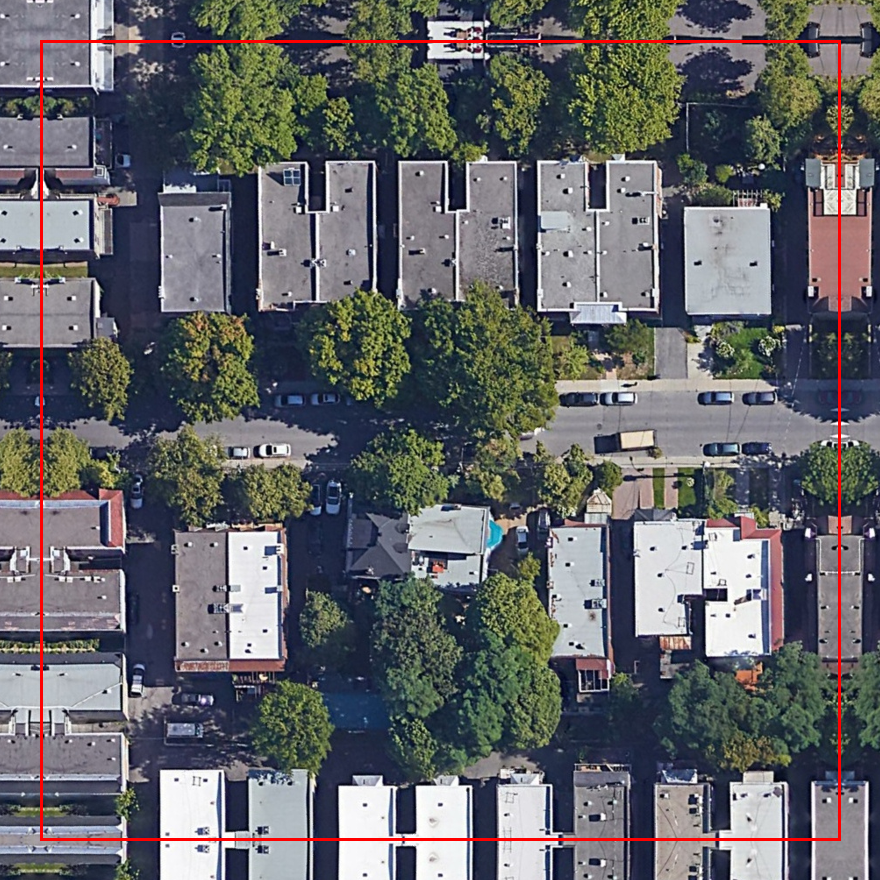

In [10]:
grid_size = 50
window = 5
image_input, patch_dim, padding = mirror_padding(input_image, grid_size, window)

from PIL import ImageDraw
img = Image.fromarray((image_input.permute(1,2,0).numpy()*255).astype('uint8')).copy()
draw = ImageDraw.Draw(img)
draw.rectangle([(padding, padding), (img.size[0]-padding, img.size[1]-padding)], 
               fill=None, outline=(255,0,0), width=3)
img

In [11]:
def get_image_attn_mask(att_mat, avg=True, layer=-1):
    # https://github.com/jeonsworld/ViT-pytorch/blob/main/visualize_attention_map.ipynb
    
    # Average the attention weights across all heads.
    att_mat = att_mat.mean(dim=1)

    # To account for residual connections, we add an identity matrix to the
    # attention matrix and re-normalize the weights.
    residual_att = torch.eye(att_mat.size(1)).cuda()
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Recursively multiply the weight matrices
    joint_attentions = torch.zeros(aug_att_mat.size()).cuda()
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
    
    # Attention from the output token to the input space.
    if avg:
        v = joint_attentions.mean(dim=0)
    else:
        v = joint_attentions[layer]
        
    grid_size = int(np.sqrt(aug_att_mat.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size)
    
    mask -= mask.min()
    mask /= mask.max()
    
    return mask

In [12]:
def generate_similarity_tensor_mean_first(image_input, model, 
                               grid_size, window, patch_dim,
                               prompts=["a photo of a building"],
                               negative_prompts=None):
    assert negative_prompts is not None, "You need negative prompts!"
    input_resolution = model.visual.input_resolution
    
    text_tokens = torch.cat([clip.tokenize(p) for p in prompts]).cuda()
    with torch.no_grad():
        text_features, text_attn_weights = model.encode_text(text_tokens)
        text_features = text_features.float()
        text_features /= text_features.norm(dim=-1, keepdim=True)
        text_features = text_features.mean(dim=0)
        text_features /= text_features.norm()
    

    text_tokens = torch.cat([clip.tokenize(p) for p in negative_prompts]).cuda()
    with torch.no_grad():
        negative_text_features, _ = model.encode_text(text_tokens)
        negative_text_features = negative_text_features.float()
        negative_text_features /= negative_text_features.norm(dim=-1, keepdim=True)
        negative_text_features = negative_text_features.mean(dim=0)
        negative_text_features /= negative_text_features.norm()

    
    batches = torch.zeros((grid_size,3,input_resolution,input_resolution)).float().cuda()
    similarities = torch.zeros((grid_size,grid_size)).int().cuda()
    for Y in range(0,grid_size, 1): # this should be done as a batch...
        for X in range(0,grid_size, 1): # this should be done as a batch...
            patch_input = image_input[:, 
                                      Y*patch_dim:Y*patch_dim+window*patch_dim, 
                                      X*patch_dim:X*patch_dim+window*patch_dim
                                     ].unsqueeze(0)
            patch_input = interpolate(patch_input, (input_resolution,input_resolution), 
                                      mode='bilinear', align_corners=True)
            patch_input = normalize(patch_input,
                                    mean=(0.48145466, 0.4578275, 0.40821073), 
                                    std=(0.26862954, 0.26130258, 0.27577711))
            batches[X] = patch_input.cuda()
            
        with torch.no_grad():
            image_features, image_attn_weights = model.encode_image(batches)
            image_features = image_features.float()

        image_features /= image_features.norm(dim=1, keepdim=True)
        similarity = (text_features @ image_features.T)
        negative_similarity = (negative_text_features @ image_features.T)
                  
        similarity = torch.column_stack((similarity,negative_similarity)).softmax(dim=1)
        similarity = (similarity[:,0]>similarity[:,1]).int()
        similarities[Y, :] = similarity
    
    return similarities

In [13]:
def generate_similarity_tensor_mean_after(image_input, model, 
                               grid_size, window, patch_dim,
                               prompts=["a photo of a building"],
                               negative_prompts=None):
    assert negative_prompts is not None, "You need negative prompts!"
    input_resolution = model.visual.input_resolution
    
    text_tokens = torch.cat([clip.tokenize(p) for p in prompts]).cuda()
    with torch.no_grad():
        text_features, _ = model.encode_text(text_tokens)
        text_features = text_features.float()
        text_features /= text_features.norm(dim=-1, keepdim=True)
    

    text_tokens = torch.cat([clip.tokenize(p) for p in negative_prompts]).cuda()
    with torch.no_grad():
        negative_text_features, _ = model.encode_text(text_tokens)
        negative_text_features = negative_text_features.float()
        negative_text_features /= negative_text_features.norm(dim=-1, keepdim=True)

    
    batches = torch.zeros((grid_size,3,input_resolution,input_resolution)).float().cuda()
    similarities = torch.zeros((grid_size,grid_size)).int().cuda()
    for Y in range(0,grid_size, 1): # this should be done as a batch...
        for X in range(0,grid_size, 1): # this should be done as a batch...
            patch_input = image_input[:, 
                                      Y*patch_dim:Y*patch_dim+window*patch_dim, 
                                      X*patch_dim:X*patch_dim+window*patch_dim
                                     ].unsqueeze(0)
            patch_input = interpolate(patch_input, (input_resolution,input_resolution), 
                                      mode='bilinear', align_corners=True)
            patch_input = normalize(patch_input,
                                    mean=(0.48145466, 0.4578275, 0.40821073), 
                                    std=(0.26862954, 0.26130258, 0.27577711))
            batches[X] = patch_input.cuda()
            
        with torch.no_grad():
            image_features, image_attn_weights = model.encode_image(batches)
            image_features = image_features.float()

        image_features /= image_features.norm(dim=1, keepdim=True)
        positive_similarity = (text_features @ image_features.T)
        positive_similarity /= 0.07 # get logits according to CLIP's code...
        negative_similarity = (negative_text_features @ image_features.T)
        negative_similarity /= 0.07 # get logits according to CLIP's code...
            
        positive_similarity = positive_similarity.mean(dim=0) # group positive prompt scores
        negative_similarity = negative_similarity.mean(dim=0) # group negative prompt scores
        similarity = torch.column_stack((positive_similarity,negative_similarity)).softmax(dim=1)
        similarities[Y, :] = (similarity[:,0]>similarity[:,1]).int()
    
    return similarities

In [14]:
def generate_similarity_tensor_mean_after_and_mask(image_input, model, 
                               grid_size, window, patch_dim,
                               prompts=["a photo of a building"],
                               negative_prompts=None):
    assert negative_prompts is not None, "You need negative prompts!"
    input_resolution = model.visual.input_resolution
    
    text_tokens = torch.cat([clip.tokenize(p) for p in prompts]).cuda()
    with torch.no_grad():
        text_features, _ = model.encode_text(text_tokens)
        text_features = text_features.float()
        text_features /= text_features.norm(dim=-1, keepdim=True)
    

    text_tokens = torch.cat([clip.tokenize(p) for p in negative_prompts]).cuda()
    with torch.no_grad():
        negative_text_features, _ = model.encode_text(text_tokens)
        negative_text_features = negative_text_features.float()
        negative_text_features /= negative_text_features.norm(dim=-1, keepdim=True)

    
    batches = torch.zeros((grid_size,3,input_resolution,input_resolution)).float().cuda()
    similarities = torch.zeros((grid_size,grid_size)).float().cuda()
    for Y in range(0,grid_size, 1): # this should be done as a batch...
        for X in range(0,grid_size, 1): # this should be done as a batch...
            patch_input = image_input[:, 
                                      Y*patch_dim:Y*patch_dim+window*patch_dim, 
                                      X*patch_dim:X*patch_dim+window*patch_dim
                                     ].unsqueeze(0)
            patch_input = interpolate(patch_input, (input_resolution,input_resolution), 
                                      mode='bilinear', align_corners=True)
            patch_input = normalize(patch_input,
                                    mean=(0.48145466, 0.4578275, 0.40821073), 
                                    std=(0.26862954, 0.26130258, 0.27577711))
            batches[X] = patch_input.cuda()
            
        with torch.no_grad():
            image_features, image_attn_weights = model.encode_image(batches)
            masks = []
            for att_weight in image_attn_weights.permute(1,0,2,3,4):
                masks.append(get_image_attn_mask(att_weight).mean())
            image_features = image_features.float()

        image_features /= image_features.norm(dim=1, keepdim=True)
        positive_similarity = (text_features @ image_features.T)
        positive_similarity /= 0.07 # get logits according to CLIP's code...
        negative_similarity = (negative_text_features @ image_features.T)
        negative_similarity /= 0.07 # get logits according to CLIP's code...
            
        positive_similarity = positive_similarity.mean(dim=0) # group positive prompt scores
        negative_similarity = negative_similarity.mean(dim=0) # group negative prompt scores
        similarity = torch.column_stack((positive_similarity,negative_similarity)).softmax(dim=1)
        similarities[Y, :] = ((similarity[:,0]>similarity[:,1]).float()*2-1)*torch.stack(masks)
    
    return similarities

In [35]:
def generate_similarity_tensor_mean_after_and_mask_window(image_input, model, 
                               grid_size, window, patch_dim,
                               prompts=["a photo of a building"],
                               negative_prompts=None):
    assert negative_prompts is not None, "You need negative prompts!"
    input_resolution = model.visual.input_resolution
    
    text_tokens = torch.cat([clip.tokenize(p) for p in prompts]).cuda()
    with torch.no_grad():
        text_features, _ = model.encode_text(text_tokens)
        text_features = text_features.float()
        text_features /= text_features.norm(dim=-1, keepdim=True)
    

    text_tokens = torch.cat([clip.tokenize(p) for p in negative_prompts]).cuda()
    with torch.no_grad():
        negative_text_features, _ = model.encode_text(text_tokens)
        negative_text_features = negative_text_features.float()
        negative_text_features /= negative_text_features.norm(dim=-1, keepdim=True)

    
    batches = torch.zeros((grid_size,3,input_resolution,input_resolution)).float().cuda()
    similarities = []
    for Y in range(0,grid_size, 1): # this should be done as a batch...
        for X in range(0,grid_size, 1): # this should be done as a batch...
            patch_input = image_input[:, 
                                      Y*patch_dim:Y*patch_dim+window*patch_dim, 
                                      X*patch_dim:X*patch_dim+window*patch_dim
                                     ].unsqueeze(0)
            patch_input = interpolate(patch_input, (input_resolution,input_resolution), 
                                      mode='bilinear', align_corners=True)
            patch_input = normalize(patch_input,
                                    mean=(0.48145466, 0.4578275, 0.40821073), 
                                    std=(0.26862954, 0.26130258, 0.27577711))
            batches[X] = patch_input.cuda()
            
        with torch.no_grad():
            image_features, image_attn_weights = model.encode_image(batches)
            masks = []
            for att_weight in image_attn_weights.permute(1,0,2,3,4):
                tmp = get_image_attn_mask(att_weight).unsqueeze(0).unsqueeze(0)
                masks.append(torch.nn.functional.interpolate(tmp,(10,10)).squeeze(0))
            image_features = image_features.float()

        image_features /= image_features.norm(dim=1, keepdim=True)
        positive_similarity = (text_features @ image_features.T)
        positive_similarity /= 0.07 # get logits according to CLIP's code...
        negative_similarity = (negative_text_features @ image_features.T)
        negative_similarity /= 0.07 # get logits according to CLIP's code...
            
        positive_similarity = positive_similarity.mean(dim=0) # group positive prompt scores
        negative_similarity = negative_similarity.mean(dim=0) # group negative prompt scores
        similarity = torch.column_stack((positive_similarity,negative_similarity)).softmax(dim=1)
        similarities.append((torch.cat(masks).permute(1,2,0)*((similarity[:,0]>similarity[:,1]).float()*2-1)).permute(2,0,1))
    
    return similarities

In [36]:
grid_size = 50
window_sizes = [1, 3, 5, 10, 20] # in grid units

# input_image = Image.open("../no_trees.jpg").resize((800,800))
# input_image = Image.open('../test_google_earth.png').resize((800,800))
# input_image = Image.open('../example_earth_100m.jpg').resize((800,800))
input_image = Image.open('../example_earth_200m.jpg').resize((800,800))
# input_image = Image.open('../example_earth_high_altitude.jpg').resize((800,800))

test_image = input_image.rotate(0)
test_prompts = ["aerial photo of a building", 
                "aerial photo of a house", 
                "aerial photo of a roof"]
negative_test_prompts = ["aerial photo of a tree", 
                         "aerial photo of a bush",
                         "aerial photo of a vehicle",
                         "aerial photo of a car",
                         "aerial photo of a road",
                         "aerial photo of a street",
                         "aerial photo of parked cars",
                         "aerial photo of asphalt"
                        ]

### Text features mean

In [37]:
similarity_all_windows = torch.zeros((len(window_sizes), grid_size, grid_size)).float().cuda()
for wi,window_size in enumerate(window_sizes):
    image_input, patch_dim, _ = mirror_padding(test_image, grid_size, window_size)
    similarity_all_windows[wi] = generate_similarity_tensor_mean_first(image_input, model, 
                                               grid_size, window_size, patch_dim,
                                               prompts=test_prompts,
                                               negative_prompts=negative_test_prompts)

In [38]:
window_size_index = 2
similarities = similarity_all_windows[window_size_index] # select output (window size)
window_sizes[window_size_index], window_sizes[window_size_index]*patch_dim, grid_size*patch_dim

(5, 80, 800)

In [39]:
similarities.min(), similarities.max()

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

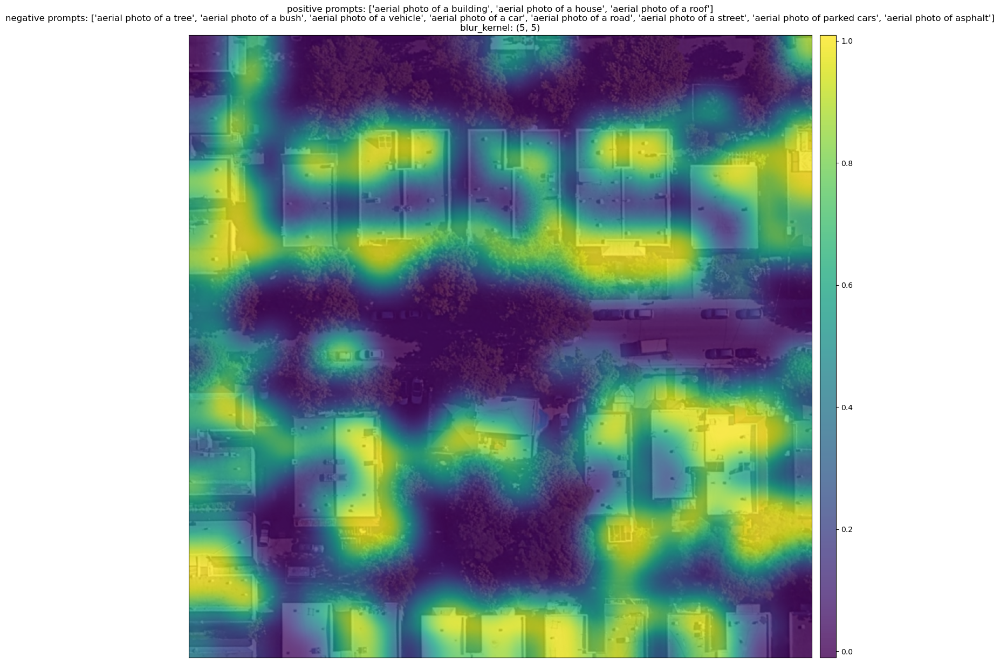

In [40]:
show_grid = False # window size is a multiple of this grid
blur_kernel = 5,5
heat_map = gaussian_blur(similarities.unsqueeze(0), blur_kernel).squeeze().cpu().numpy()
# heat_map -= heat_map.mean()
# heat_map = np.clip(heat_map, 0, np.inf)
# heat_map -= heat_map.min()
# heat_map /= heat_map.max()

fig=plt.figure(figsize=(15,15))
plt.imshow(np.asarray(test_image))
im = plt.imshow(np.asarray(Image.fromarray(heat_map).resize(test_image.size)), alpha=0.8)

title = f"positive prompts: {test_prompts}\n"
title +=f"negative prompts: {negative_test_prompts}\n"
title+= f"blur_kernel: {blur_kernel}"

ax = plt.gca() # I know, I know... I should use ax instead missing it with plt...
if show_grid:
    ax.set_xticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.set_yticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.grid(color='white', linestyle='-', linewidth=0.25)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

plt.title(title)
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax)
plt.show()

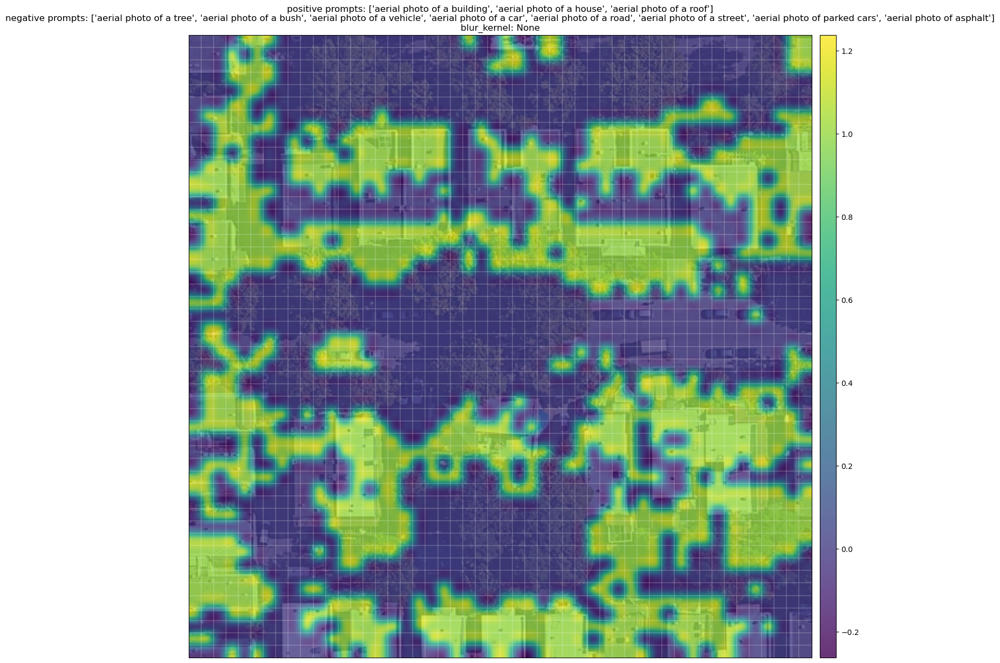

In [41]:
show_grid = True # window size is a multiple of this grid

blur_kernel = None
heat_map = similarities.cpu().numpy()
# heat_map -= heat_map.mean()
# heat_map = np.clip(heat_map, 0, np.inf)
# heat_map -= heat_map.min()
# heat_map /= heat_map.max()

fig=plt.figure(figsize=(15,15))
plt.imshow(np.asarray(test_image))
im = plt.imshow(np.asarray(Image.fromarray(heat_map).resize(test_image.size)), alpha=0.8)
# plt.imshow(heat_map, alpha=0.8)

title = f"positive prompts: {test_prompts}\n"
title +=f"negative prompts: {negative_test_prompts}\n"
title+= f"blur_kernel: {blur_kernel}"

ax = plt.gca() # I know, I know... I should use ax instead missing it with plt...
if show_grid:
    ax.set_xticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.set_yticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.grid(color='white', linestyle='-', linewidth=0.25)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

plt.title(title)
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax)
plt.show()

### Final similarity mean

In [42]:
similarity_all_windows = torch.zeros((len(window_sizes), grid_size, grid_size)).float().cuda()
for wi,window_size in enumerate(window_sizes):
    image_input, patch_dim, _ = mirror_padding(test_image, grid_size, window_size)
    similarity_all_windows[wi] = generate_similarity_tensor_mean_after(image_input, model, 
                                               grid_size, window_size, patch_dim,
                                               prompts=test_prompts,
                                               negative_prompts=negative_test_prompts)

In [43]:
window_size_index = 2
similarities = similarity_all_windows[window_size_index] # select output (window size)
window_sizes[window_size_index], window_sizes[window_size_index]*patch_dim, grid_size*patch_dim

(5, 80, 800)

In [44]:
similarities.min(), similarities.max()

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

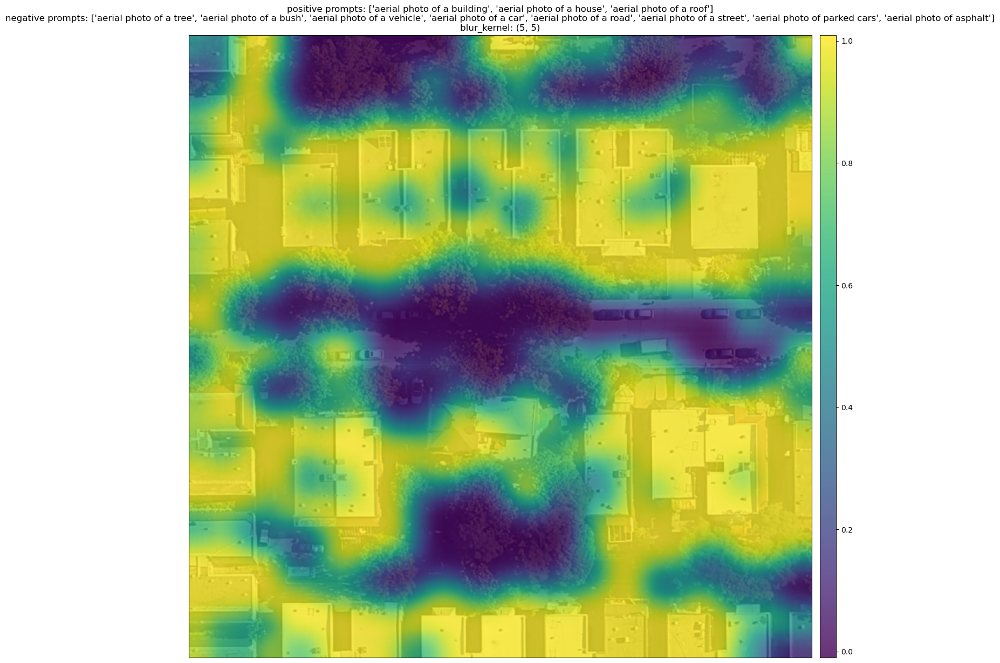

In [45]:
show_grid = False # window size is a multiple of this grid
blur_kernel = 5,5
heat_map = gaussian_blur(similarities.unsqueeze(0), blur_kernel).squeeze().cpu().numpy()
# heat_map -= heat_map.mean()
# heat_map = np.clip(heat_map, 0, np.inf)
# heat_map -= heat_map.min()
# heat_map /= heat_map.max()

fig=plt.figure(figsize=(15,15))
plt.imshow(np.asarray(test_image))
im = plt.imshow(np.asarray(Image.fromarray(heat_map).resize(test_image.size)), alpha=0.8)

title = f"positive prompts: {test_prompts}\n"
title +=f"negative prompts: {negative_test_prompts}\n"
title+= f"blur_kernel: {blur_kernel}"

ax = plt.gca() # I know, I know... I should use ax instead missing it with plt...
if show_grid:
    ax.set_xticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.set_yticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.grid(color='white', linestyle='-', linewidth=0.25)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

plt.title(title)
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax)
plt.show()

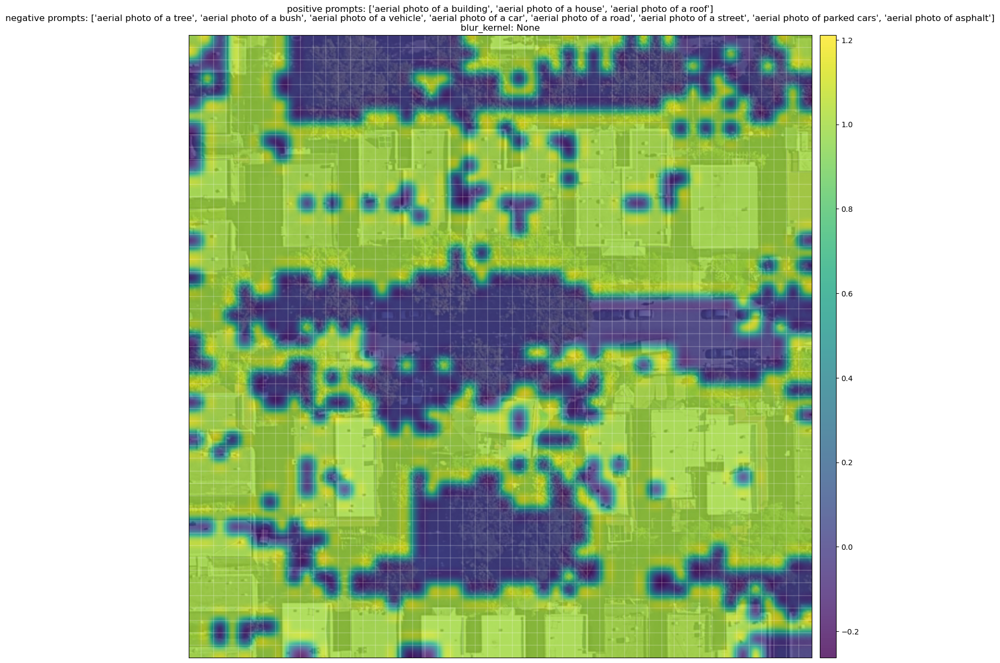

In [46]:
show_grid = True # window size is a multiple of this grid

blur_kernel = None
heat_map = similarities.cpu().numpy()
# heat_map -= heat_map.mean()
# heat_map = np.clip(heat_map, 0, np.inf)
# heat_map -= heat_map.min()
# heat_map /= heat_map.max()

fig=plt.figure(figsize=(15,15))
plt.imshow(np.asarray(test_image))
im = plt.imshow(np.asarray(Image.fromarray(heat_map).resize(test_image.size)), alpha=0.8)
# plt.imshow(heat_map, alpha=0.8)

title = f"positive prompts: {test_prompts}\n"
title +=f"negative prompts: {negative_test_prompts}\n"
title+= f"blur_kernel: {blur_kernel}"

ax = plt.gca() # I know, I know... I should use ax instead missing it with plt...
if show_grid:
    ax.set_xticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.set_yticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.grid(color='white', linestyle='-', linewidth=0.25)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

plt.title(title)
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax)
plt.show()

### Final similarity mean + attention mean

In [47]:
similarity_all_windows = torch.zeros((len(window_sizes), grid_size, grid_size)).float().cuda()
for wi,window_size in enumerate(window_sizes):
    image_input, patch_dim, _ = mirror_padding(test_image, grid_size, window_size)
    similarity_all_windows[wi] = generate_similarity_tensor_mean_after_and_mask(image_input, model, 
                                               grid_size, window_size, patch_dim,
                                               prompts=test_prompts,
                                               negative_prompts=negative_test_prompts)

In [48]:
window_size_index = 2
similarities = similarity_all_windows[window_size_index] # select output (window size)
window_sizes[window_size_index], window_sizes[window_size_index]*patch_dim, grid_size*patch_dim

(5, 80, 800)

In [49]:
similarities.min(), similarities.max()

(tensor(-0.6426, device='cuda:0'), tensor(0.6205, device='cuda:0'))

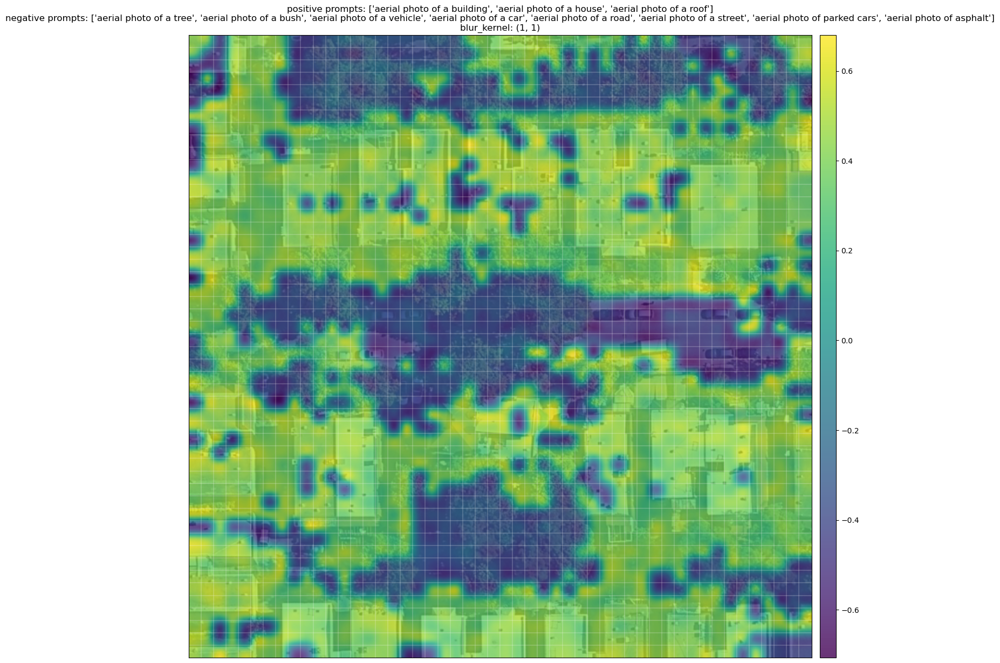

In [50]:
show_grid = True # window size is a multiple of this grid
blur_kernel = 1,1
heat_map = gaussian_blur(similarities.unsqueeze(0), blur_kernel).squeeze().cpu().numpy()
# heat_map -= heat_map.mean()
# heat_map = np.clip(heat_map, 0, np.inf)
# heat_map -= heat_map.min()
# heat_map /= heat_map.max()

fig=plt.figure(figsize=(15,15))
plt.imshow(np.asarray(test_image))
im = plt.imshow(np.asarray(Image.fromarray(heat_map).resize(test_image.size)), alpha=0.8)

title = f"positive prompts: {test_prompts}\n"
title +=f"negative prompts: {negative_test_prompts}\n"
title+= f"blur_kernel: {blur_kernel}"

ax = plt.gca() # I know, I know... I should use ax instead missing it with plt...
if show_grid:
    ax.set_xticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.set_yticks(np.arange(-.5, test_image.size[0]-1, test_image.size[0]/grid_size))
    ax.grid(color='white', linestyle='-', linewidth=0.25)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

plt.title(title)
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
plt.colorbar(im, cax=cax)
plt.show()

### Final similarity mean + attention window

In [51]:
similarity_all_windows = []
for wi,window_size in enumerate(window_sizes):
    image_input, patch_dim, _ = mirror_padding(test_image, grid_size, window_size)
    tmp = generate_similarity_tensor_mean_after_and_mask_window(image_input, model, 
                                               grid_size, window_size, patch_dim,
                                               prompts=test_prompts,
                                               negative_prompts=negative_test_prompts)
    similarity_all_windows.append(tmp)

In [52]:
window_size_index = 2
similarities = similarity_all_windows[window_size_index] # select output (window size)

heat_map = np.zeros((5*grid_size+5,5*grid_size+5), dtype='float')
for i in range(grid_size):
    for j in range(grid_size):
        ic = i*5+5
        jc = j*5+5
        heat_map[ic-5:ic+5, jc-5:jc+5] += similarities[i][j].cpu().numpy()

In [53]:
heat_map.min(), heat_map.max()

(-3.776125729084015, 3.964500606060028)

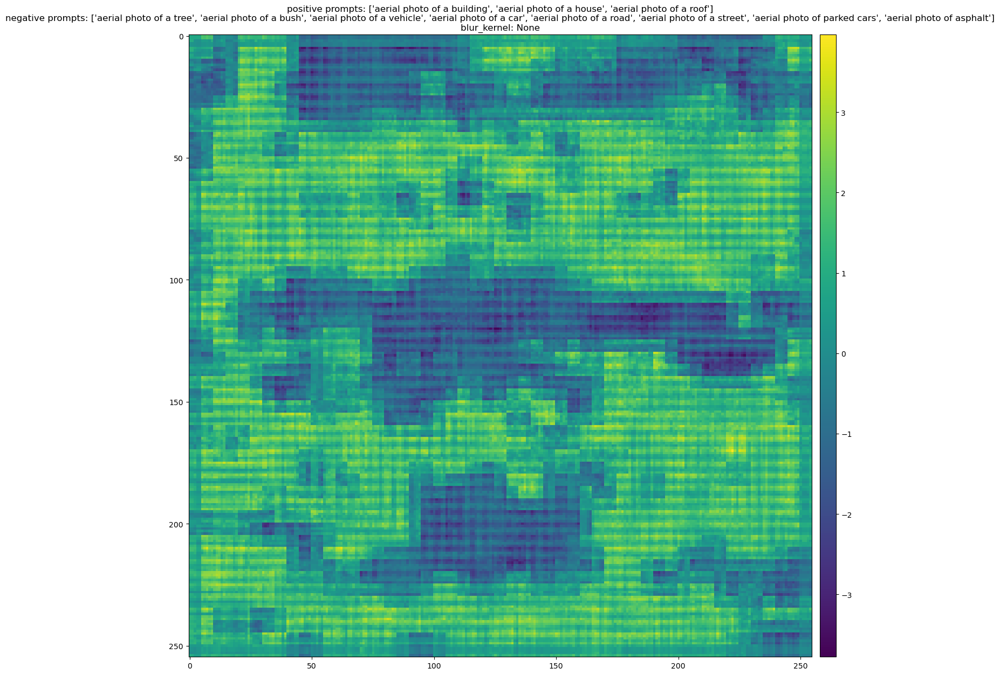

In [54]:
title = f"positive prompts: {test_prompts}\n"
title +=f"negative prompts: {negative_test_prompts}\n"
title+= f"blur_kernel: {None}"

fig, ax = plt.subplots(1,1,figsize=(15,15))
im = ax.imshow(heat_map)
ax.set_title(title)
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
fig.colorbar(im, cax=cax)
plt.show()